StreetStatistics and Data Wrangling

StreetStatistics is a unique project that uses artificial intelligence to gather its data and then performs methods on the data to get the statistics the program wishes to display. Based on the results of the YOLO V9 Segmentation model, data is collected once certain tracking variables are met. This data is written to several JSON files which each serve a different purpose. These JSON files are then read and used for further data exploration and calculation in real time. As this occurs all throughout the process and not necessarily at a singular place, I will be taking snippets of code based on where in the process they take place and explaining them.

When running an image through the yolo model, weget an output which contains vast amounts of data. It’s important to pick out the data you can work with effectively, given that StreetStatistics is attempting to track targets which are segmented by the model. Since we wish to detect movement, we must have an anchor point as a measure of identifying location frame to frame. To do this we take the coordinates of the mask and box around the max. We gather the xmin, ymin, xmax and ymax coordinates. When we average these out we can get the coordinates of the center of the segment. This will act as our anchor point.


In [61]:
!pip install ultralytics

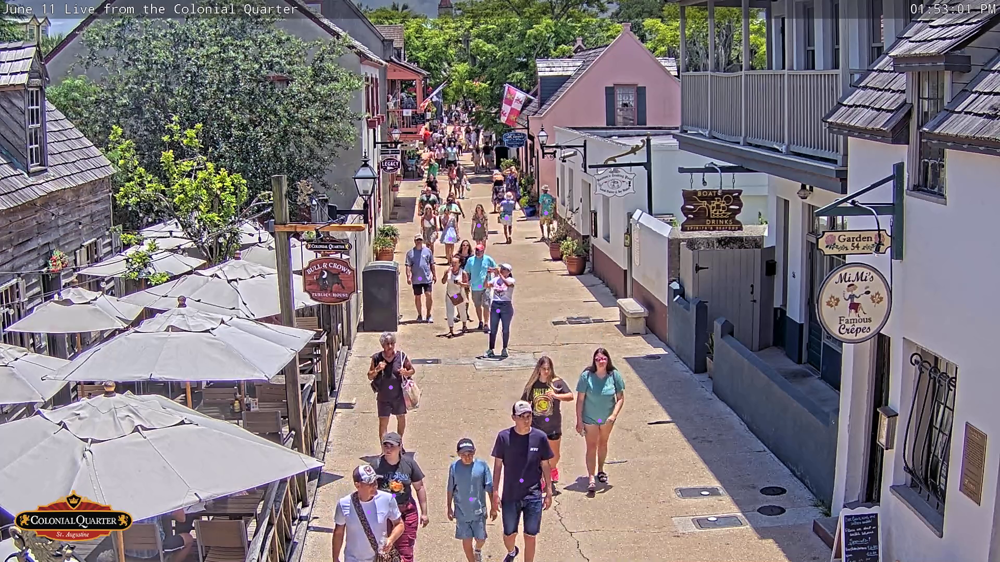

In [62]:
from ultralytics import YOLO
from google.colab.patches import cv2_imshow
import cv2
import pandas as pd
import numpy as np
image_1_path = '/content/20240611_135337.png'
image_2_path = '/content/20240611_135338.png'
model = YOLO('yolov9e-seg.pt')
image_1 = cv2.imread(image_1_path)
image_2 = cv2.imread(image_1_path)


results = model(image_1, classes=[0,2,3,5,7], line_width=1, show_boxes=True, retina_masks=True, verbose=False)
for result in results:
     boxes = result.boxes.xyxy.cpu().numpy().astype(int)
     masks = result.masks.xy
     for box, masks in zip(boxes, masks):
            xmin, ymin, xmax, ymax = box
            x_center = (xmin + xmax) // 2
            y_center = (ymin + ymax) // 2
            cv2.circle(image_1, (x_center, y_center), radius=4, color=(255, 105, 180), thickness=-1)
cv2_imshow(image_1)
# StreetStatistics gathers more data from the results of the YOLO model in reality, but these are written to JSON and used later on.

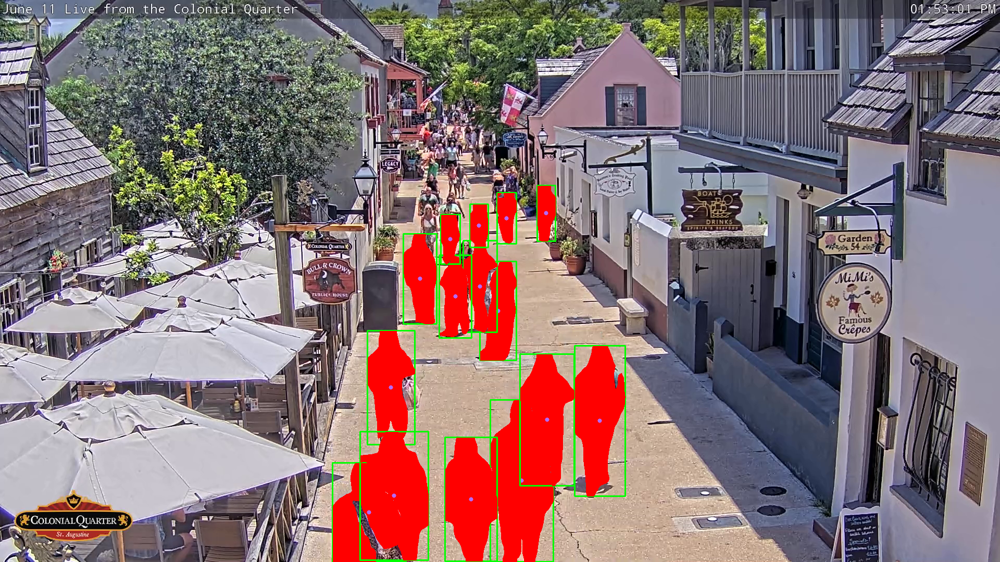

In [63]:
# We can also draw the segmentation or box by doing
results = model(image_2, classes=[0,2,3,5,7], line_width=1, show_boxes=True, retina_masks=True, verbose=False)
for result in results:
     boxes = result.boxes.xyxy.cpu().numpy().astype(int)
     masks = result.masks.xy
     for box, mask in zip(boxes, masks):
            xmin, ymin, xmax, ymax = box
            x_center = (xmin + xmax) // 2
            y_center = (ymin + ymax) // 2
            cv2.rectangle(image_2, (xmin, ymin), (xmax, ymax), color=(0, 255, 0), thickness=2)

            if mask.size > 0:
              mask_poly = np.array(mask, dtype=np.int32).reshape((-1, 1, 2))
              mask_poly = np.append(mask_poly, [mask_poly[0]], axis=0)
              cv2.fillPoly(image_2, [mask_poly], (0,0,255))
            cv2.circle(image_2, (x_center, y_center), radius=4, color=(255, 105, 180), thickness=-1)

cv2_imshow(image_2)
# StreetStatistics gathers more data from the results of the YOLO model in reality, but these are written to JSON and used later on.


Now that we have the coordinates to the anchor points of each individual, we can start tracking them. If you have the anchor points of a moving individual spanning several frames, you are able to draw a line between each anchor point, after doing this you are left with a line which shows the movement of the individual. In order to count individuals, we can detect if they have crossed a specific line using the anchor points and a predefined line. StreetStatistics relies on a structure including several lines that the user can visualize themselves and alter, each line serves its own purpose for collecting data and ensuring the data is correct. However the root of this is based on the intersection of two lines, which we can calculate with a predefined mathematical formula that you can see in the function below.


In [64]:
def draw_all_regions(img, points):
    # Define regions using points
    regions = {
        'Region1': ['RegL', 'RegR', 'DeRegR', 'DeRegL'],
        'Region3': ['DeReg1L', 'DeReg1R', 'Reg1R', 'Reg1L'],
        'Region2': ['DeRegL', 'DeRegR', 'DeReg1R', 'DeReg1L']
    }
    colors = [(255, 0, 0), (0, 255, 0), (0, 0, 255)]  # Adjusted for visibility
    for color, region in zip(colors, regions.values()):
        pts = np.array([points[pt] for pt in region], np.int32)
        pts = pts.reshape((-1, 1, 2))
        cv2.polylines(img, [pts], isClosed=True, color=color, thickness=2)
    return img



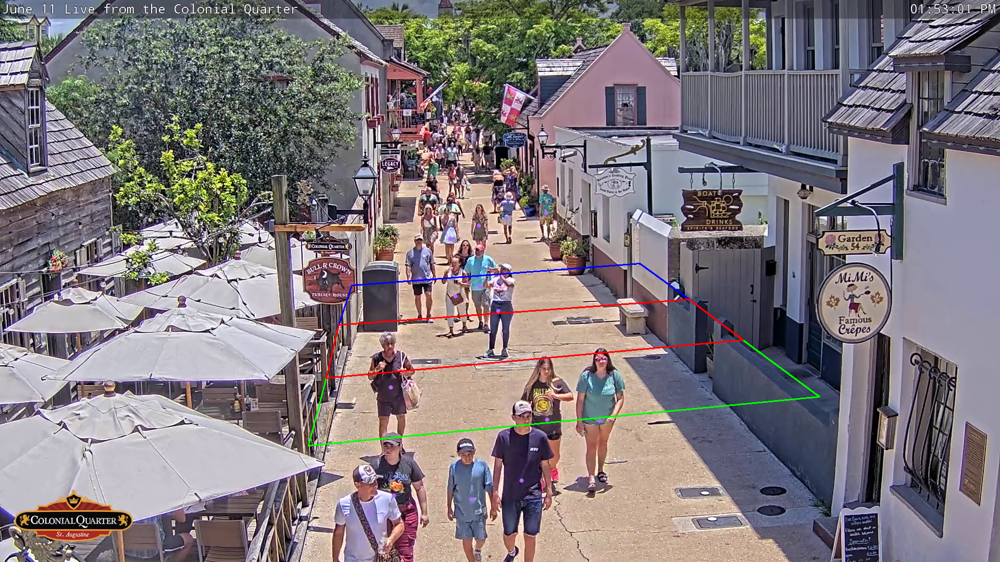

In [65]:
points = {
    'DeReg1L': [626, 726], 'DeReg1R': [1426, 653],
    'DeRegL': [650, 624], 'DeRegR': [1323, 575],
    'RegL': [675, 548], 'RegR': [1228, 506],
    'Reg1L': [592, 856], 'Reg1R': [1573, 762]}
structure_drawn = draw_all_regions(image_1, points)
cv2_imshow(structure_drawn)

Now that we have the coordinates to the anchor points of each individual, we can start tracking them. If you have the anchor points of a moving individual spanning several frames, you are able to draw a line between each anchor point, after doing this you are left with a line which shows the movement of the individual. In order to count individuals, we can detect if they have crossed a specific line using the anchor points and a predefined line. StreetStatistics relies on a structure including several lines that the user can visualize themselves and alter, each line serves its own purpose for collecting data and ensuring the data is correct. However the root of this is based on the intersection of two lines, which we can calculate with a predefined mathematical formula that you can see in the function below.

True


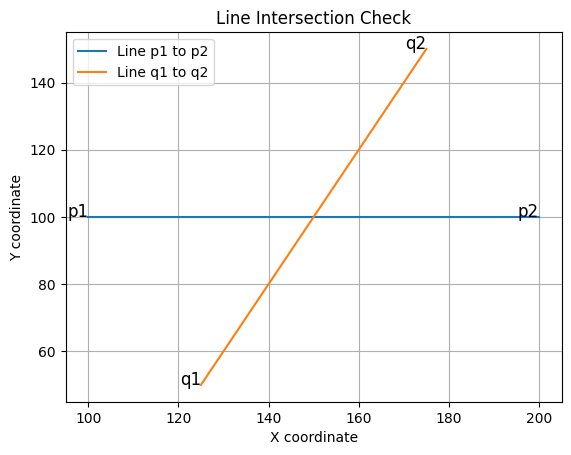

In [66]:
#Here p1 and p2 are coordinates of the anchor points / center points. And q1 and q2 are the coordinates of the line that you are checking. (The base line essentially)
import matplotlib.pyplot as plt
p1 = (100, 100)
p2 = (200,100)
q1 = (125, 50)
q2 = (175, 150)


def intersects(q1, q2):
    def ccw(A, B, C):
        return (C[1] - A[1]) * (B[0] - A[0]) > (B[1] - A[1]) * (C[0] - A[0])
    return ccw(p1, q1, q2) != ccw(p2, q1, q2) and ccw(p1, p2, q1) != ccw(p1, p2, q2)



def plot_lines(q1, q2):
    fig, ax = plt.subplots()
    plt.plot([p1[0], p2[0]], [p1[1], p2[1]], label='Line p1 to p2')
    plt.plot([q1[0], q2[0]], [q1[1], q2[1]], label='Line q1 to q2')
    plt.text(p1[0], p1[1], 'p1', fontsize=12, ha='right')
    plt.text(p2[0], p2[1], 'p2', fontsize=12, ha='right')
    plt.text(q1[0], q1[1], 'q1', fontsize=12, ha='right')
    plt.text(q2[0], q2[1], 'q2', fontsize=12, ha='right')
    ax.set_xlabel('X coordinate')
    ax.set_ylabel('Y coordinate')
    ax.set_title('Line Intersection Check')
    plt.legend()
    plt.grid(True)
    plt.show()

print(intersects(q1, q2))
plot_lines(q1, q2)

# If the output is true then the lines intersect, this means the line has been crossed. Plotting a simple graph to display that this is the case

Doing this for all the lines and using some logic that our structure provides we can then extract data. We can count someone confidently and gather what direction they came from and at which moment in time. This data is then parsed to a JSON file, which the PyQt5 application reads and uses to display the data respective to the current frame being shown.
Slight changes to the data are then made, such as reformatting datetime objects.


We work most with data once you export it. Using the export button you can, at any time during the process, open up a website on the local host, which displays further statistics and also allows you to copy the DataFrame of your session to clipboard.
On the website we display most data you can also see within the application, on top of that we also showcase 3 different graphs which gives the user further insight of the data collected.


In [67]:
from datetime import datetime, timedelta
import random

def generate_pseudo_dataset(size):
    data = []
    directions = [1, 2]
    class_ids = ['0', '2', '3', '5', '7']
    start_time = datetime.now() - timedelta(hours=24)
    for _ in range(size):
        random_seconds = random.randint(0, 86400)
        timestamp = start_time + timedelta(seconds=random_seconds)
        direction = random.choice(directions)
        class_id = random.choice(class_ids)
        data.append([timestamp.isoformat(), direction, class_id])
    df = pd.DataFrame(data, columns=['timestamp', 'direction', 'class_id'])
    return df


pseudo_df = generate_pseudo_dataset(300)
pseudo_df.head(10)

# We first need a dataframe, all of this data would normally be gathered inside of StreetStatistics in real time.

,timestamp,direction,class_id
0,2024-09-12T10:48:18.910656,1,2
1,2024-09-12T03:36:46.910656,1,5
2,2024-09-12T04:54:07.910656,1,3
3,2024-09-12T17:49:04.910656,1,2
4,2024-09-12T03:18:31.910656,2,2
5,2024-09-11T23:15:22.910656,1,2
6,2024-09-12T07:39:55.910656,1,3
7,2024-09-12T11:54:40.910656,1,0
8,2024-09-11T20:41:26.910656,2,7
9,2024-09-12T15:50:33.910656,2,0


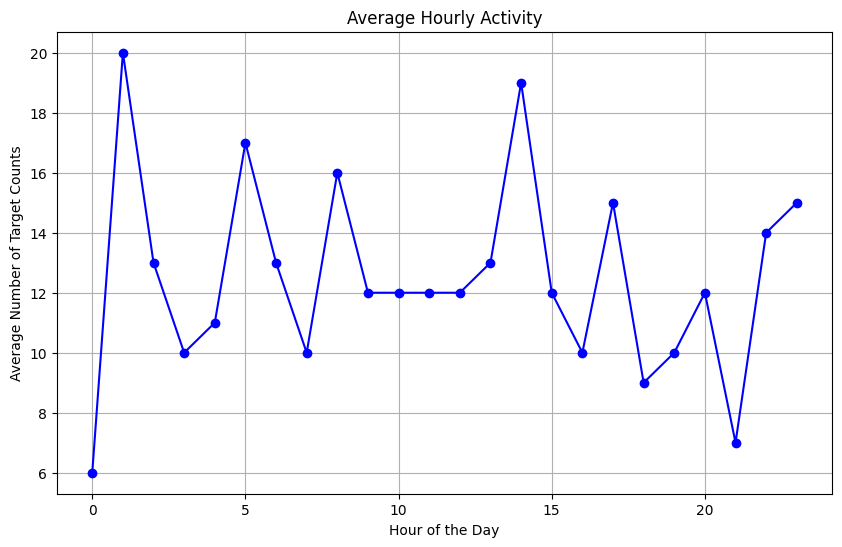

In [68]:
import io
import base64
def generate_hourly_activity_plot(df):
    # We add a check to see if we have any data available, if not we generate an empty plot.
    if df.empty:
        plt.figure(figsize=(10, 6))
        plt.plot([], [], marker='o', color='b', linestyle='-')
        plt.title('Average Hourly Activity (No Data)')
        plt.xlabel('Hour of the Day')
        plt.ylabel('Average Number of Target Counts')
        plt.grid(True)
    else:
        df['timestamp'] = pd.to_datetime(df['timestamp'])
        df['hour'] = df['timestamp'].dt.hour
        hourly_counts = df.groupby('hour').size()
        hourly_counts = hourly_counts.reindex(range(24), fill_value=0)
        # We take the hour of every time stamp and sort by this, on a 24hr basis. This means that 1:13 PM 9/12/2024 counts the same as 1:13 PM 9/13/2024.
        # This allows you to average out over longer periods of time.
        plt.figure(figsize=(10, 6))
        plt.plot(hourly_counts.index, hourly_counts.values, marker='o', color='b', linestyle='-')
        plt.title('Average Hourly Activity')
        plt.xlabel('Hour of the Day')
        plt.ylabel('Average Number of Target Counts')
        plt.grid(True)


    # We save the plot to a string buffer to showcase later on, this is used in the program not here.
    img = io.BytesIO()
    plt.savefig(img, format='png')
    img.seek(0)
    plot_url = base64.b64encode(img.getvalue()).decode('utf8')
    plt.show()
    # return plot_url


generate_hourly_activity_plot(pseudo_df)

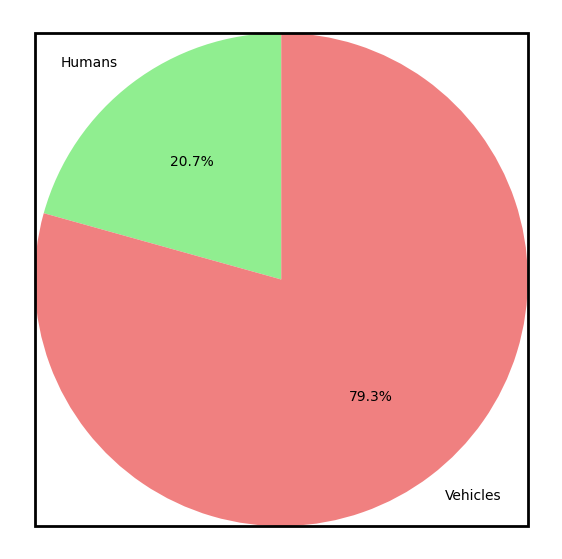

Total number of humans: 62
Total number of vehicles: 238


<Figure size 640x480 with 0 Axes>

In [69]:
def generate_class_distribution_plot(df):
    # Check if we have data; if not, create an empty pie chart
    if df.empty:
        labels = ['Humans', 'Vehicles']
        sizes = [0, 0]
    else:
        # Define classes: 0 is humans, 2, 3, 5, 7 are vehicles
        human_count = df[df['class_id'] == '0'].shape[0]
        vehicle_count = df[df['class_id'].isin(['2', '3', '5', '7'])].shape[0]
        labels = ['Humans', 'Vehicles']
        sizes = [human_count, vehicle_count]

    # Generate the pie chart with a box around it
    plt.figure(figsize=(7, 7))
    plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=90, colors=['lightgreen', 'lightcoral'])
    plt.axis('equal')  # Equal aspect ratio ensures the pie chart is a circle.
    plt.gca().add_patch(plt.Rectangle((-1, -1), 2, 2, fill=False, edgecolor="black", lw=2))  # Box around pie chart

    # Show the pie chart for local testing
    plt.show()

    # Save the plot to a string buffer for use later on.
    img = io.BytesIO()
    plt.savefig(img, format='png')
    img.seek(0)
    plot_url = base64.b64encode(img.getvalue()).decode('utf8')

    # return plot_url

generate_class_distribution_plot(pseudo_df)
human_count = pseudo_df[pseudo_df['class_id'] == '0'].shape[0]
vehicle_count = pseudo_df[pseudo_df['class_id'].isin(['2', '3', '5', '7'])].shape[0]
print(f"Total number of humans: {human_count}")
print(f"Total number of vehicles: {vehicle_count}")

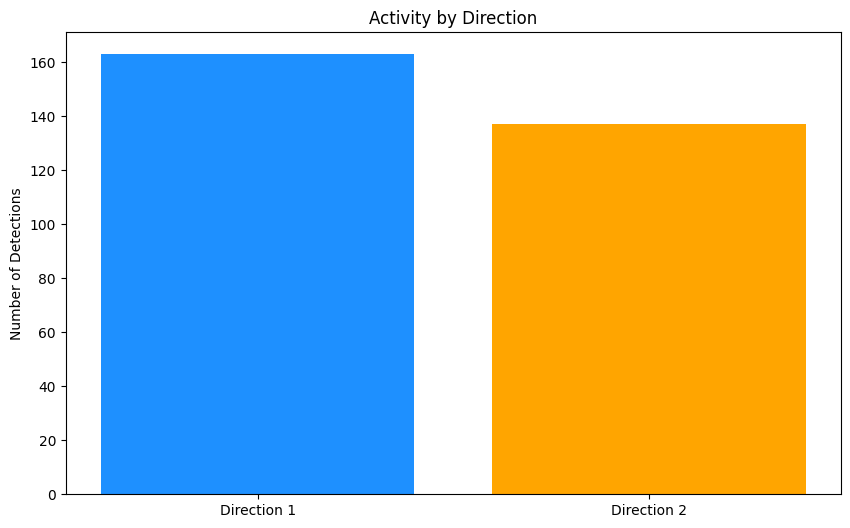

<Figure size 640x480 with 0 Axes>

In [70]:
def generate_direction_plot(df):
    # Check if we have data; if not, create an empty bar chart
    if df.empty:
        labels = ['Direction 1', 'Direction 2']
        sizes = [0, 0]
    else:
        # Count occurrences of each direction
        dir_1_count = df[df['direction'] == 1].shape[0]
        dir_2_count = df[df['direction'] == 2].shape[0]
        labels = ['Direction 1', 'Direction 2']
        sizes = [dir_1_count, dir_2_count]

    # Generate the bar chart for directions
    plt.figure(figsize=(10, 6))
    plt.bar(labels, sizes, color=['dodgerblue', 'orange'])
    plt.title('Activity by Direction')
    plt.ylabel('Number of Detections')

    plt.show()

    # Save the plot to a string buffer for later on.
    img = io.BytesIO()
    plt.savefig(img, format='png')
    img.seek(0)
    plot_url = base64.b64encode(img.getvalue()).decode('utf8')

    # return plot_url
generate_direction_plot(pseudo_df)